<a href="https://colab.research.google.com/github/leonardo-91/tesis_fabio/blob/main/Tesis_Fabio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Preprosesamiento de imagenes**

Librerias

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
from google.colab import drive
from scipy.stats import kurtosis
from scipy.stats import skew
import matplotlib.pyplot as plt
import pylab as pl
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tabulate import tabulate
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn import metrics
from datetime import datetime
from datetime import timedelta
import math
import os
import shutil

Leemos clasificacion

In [ ]:
df_lineas=pd.read_csv("/content/drive/MyDrive/Tesis Fabio/clasificacion_joyas/insumos/clasificacion_producto/linea_label (1).csv")

In [ ]:
df_lineas.head(10)

,IdLinea,NombreLinea,IdLinea_Label
0,'00,PLATA,NaN
1,'01,ANILLOS,0.0
2,'02,ARETES,1.0
3,'03,ARGOLLAS,2.0
4,'04,AROS,3.0
5,'05,CADENAS,4.0
6,'06,CANDONGAS,5.0
7,'07,CRUZ,6.0
8,'08,DIJES,7.0
9,'09,ESCLAVAS,9.0


In [ ]:
df_lineas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   IdLinea        91 non-null     object 
 1   NombreLinea    91 non-null     object 
 2   IdLinea_Label  82 non-null     float64
dtypes: float64(1), object(2)
memory usage: 2.3+ KB


In [ ]:
df_lineas.IdLinea_Label=df_lineas.IdLinea_Label.astype('Int64')

In [ ]:
df_lineas.head()

,IdLinea,NombreLinea,IdLinea_Label
0,'00,PLATA,<NA>
1,'01,ANILLOS,0
2,'02,ARETES,1
3,'03,ARGOLLAS,2
4,'04,AROS,3


In [ ]:
df_lineas.NombreLinea.value_counts()

,count
NombreLinea,
PLATA,1
ANILLOS,1
ARETES,1
ARGOLLAS,1
AROS,1
...,...
LONGINES xx,1
DYG xx,1
BREIL xx,1


**Crear carpeta de Train**

In [ ]:
df_lineas.NombreLinea= df_lineas.NombreLinea.str.strip().str.replace(' ', '_').str.lower()

In [ ]:
df_lineas.NombreLinea.value_counts()

,count
NombreLinea,
plata,1
anillos,1
aretes,1
argollas,1
aros,1
...,...
longines_xx,1
dyg__xx,1
breil__xx,1


**Recorrer muestra de imagenes**

In [ ]:
df_muestra=pd.read_csv("/content/drive/MyDrive/Tesis Fabio/clasificacion_joyas/dataset/muestra.csv")

In [ ]:
df_muestra.head()

,train,IdProducto,IdLinea,TipoProducto,IdGenero,IdColeccion,IdLinea_Label,IdFormaJoya,IdSubForma,Rodinado,Satinado,Diamantado,Visos,Esmaltado,Liso,TonoOro,IdTipoBroche,IdTipoTejido,IdTipoTerminado
0,True,'011173T026,'41,J,55,0,18,390,0,1,0,0,0,0,0,601,0,0,0
1,False,'011173T026,'41,J,55,0,18,390,0,1,0,0,0,0,0,601,0,0,0
2,True,'011173T026,'41,J,55,0,18,390,0,1,0,0,0,0,0,601,0,0,0
3,True,'011173T026,'41,J,55,0,18,390,0,1,0,0,0,0,0,601,0,0,0
4,True,'011173T026,'41,J,55,0,18,390,0,1,0,0,0,0,0,601,0,0,0


In [ ]:
df_muestra.count()

,0
train,444
IdProducto,444
IdLinea,444
TipoProducto,444
IdGenero,444
IdColeccion,444
IdLinea_Label,444
IdFormaJoya,444
IdSubForma,444
Rodinado,444


**UnirDF**

In [ ]:
df_unido=pd.merge(df_muestra,df_lineas,on='IdLinea_Label')

In [ ]:
df_unido.count()

,0
train,444
IdProducto,444
IdLinea_x,444
TipoProducto,444
IdGenero,444
IdColeccion,444
IdLinea_Label,444
IdFormaJoya,444
IdSubForma,444
Rodinado,444


In [ ]:
df_unido.head()

,train,IdProducto,IdLinea_x,TipoProducto,IdGenero,IdColeccion,IdLinea_Label,IdFormaJoya,IdSubForma,Rodinado,...,Diamantado,Visos,Esmaltado,Liso,TonoOro,IdTipoBroche,IdTipoTejido,IdTipoTerminado,IdLinea_y,NombreLinea
0,True,'011173T026,'41,J,55,0,18,390,0,1,...,0,0,0,0,601,0,0,0,'41,anillo_compromiso
1,False,'011173T026,'41,J,55,0,18,390,0,1,...,0,0,0,0,601,0,0,0,'41,anillo_compromiso
2,True,'011173T026,'41,J,55,0,18,390,0,1,...,0,0,0,0,601,0,0,0,'41,anillo_compromiso
3,True,'011173T026,'41,J,55,0,18,390,0,1,...,0,0,0,0,601,0,0,0,'41,anillo_compromiso
4,True,'011173T026,'41,J,55,0,18,390,0,1,...,0,0,0,0,601,0,0,0,'41,anillo_compromiso


***Revisar cuantos nombres tenemos***

In [ ]:
df_unido.NombreLinea.value_counts()

,count
NombreLinea,
argollas,166
anillo_compromiso,119
topos,107
pulseras,42
esclavas,10


In [ ]:
df_unido.IdLinea_Label.value_counts()

,count
IdLinea_Label,
2,166
18,119
12,107
11,42
9,10


In [ ]:
df_unido[["IdProducto","NombreLinea"]].value_counts()

,,count
IdProducto,NombreLinea,
'011173T026,anillo_compromiso,119
'5310001034,argollas,107
'3512700009,topos,65
'5310207016,argollas,59
'1310001008,pulseras,42
'1510021022,topos,42
'0910008020,esclavas,10


**Armado de carpeta de Train**

Limpiamos caracteres especiales

In [ ]:
df_unido['IdProducto']=df_unido['IdProducto'].astype(str).str.replace("'", "")

In [ ]:
df_unido[['IdProducto', 'NombreLinea']].drop_duplicates()

,IdProducto,NombreLinea
0,011173T026,anillo_compromiso
8,3512700009,topos
32,5310207016,argollas
176,5310001034,argollas
312,0910008020,esclavas
322,1310001008,pulseras
375,1510021022,topos


In [ ]:
ruta_origen = "/content/drive/MyDrive/Tesis Fabio/clasificacion_joyas/dataset/images/train"
ruta_destino = "/content/drive/MyDrive/Tesis Fabio/dataset/train"


df_map = df_unido[['IdProducto', 'NombreLinea']].drop_duplicates()

# Diccionario: {1: "anillo", 2: "anillo", 3: "brazalete"}
mapa_productos = dict(zip(df_map['IdProducto'], df_map['NombreLinea']))

# === RECORRER Y COPIAR ===
for nombre_img in os.listdir(ruta_origen):
    if not nombre_img.endswith('.jpg'):
        continue

    try:
        id_producto = nombre_img.split('_')[0]  # extrae "1" de "1_fecha.jpg"
    except:
        print(f"❌ No se pudo interpretar id_producto en: {nombre_img}")
        continue

    if id_producto in mapa_productos:
        clase = mapa_productos[id_producto]
        carpeta_clase = os.path.join(ruta_destino, clase)
        os.makedirs(carpeta_clase, exist_ok=True)

        origen = os.path.join(ruta_origen, nombre_img)
        destino = os.path.join(carpeta_clase, nombre_img)
        shutil.copy(origen, destino)
    else:
        print(f"⚠️ id_producto {id_producto} no encontrado en df para {nombre_img}")

**Armado de carpeta de Val**

In [ ]:
ruta_origen = "/content/drive/MyDrive/Tesis Fabio/clasificacion_joyas/dataset/images/val"
ruta_destino = "/content/drive/MyDrive/Tesis Fabio/dataset/val"


df_map = df_unido[['IdProducto', 'NombreLinea']].drop_duplicates()

# Diccionario: {1: "anillo", 2: "anillo", 3: "brazalete"}
mapa_productos = dict(zip(df_map['IdProducto'], df_map['NombreLinea']))

# === RECORRER Y COPIAR ===
for nombre_img in os.listdir(ruta_origen):
    if not nombre_img.endswith('.jpg'):
        continue

    try:
        id_producto = nombre_img.split('_')[0]  # extrae "1" de "1_fecha.jpg"
    except:
        print(f"❌ No se pudo interpretar id_producto en: {nombre_img}")
        continue

    if id_producto in mapa_productos:
        clase = mapa_productos[id_producto]
        carpeta_clase = os.path.join(ruta_destino, clase)
        os.makedirs(carpeta_clase, exist_ok=True)

        origen = os.path.join(ruta_origen, nombre_img)
        destino = os.path.join(carpeta_clase, nombre_img)
        shutil.copy(origen, destino)
    else:
        print(f"⚠️ id_producto {id_producto} no encontrado en df para {nombre_img}")

Instalar YOLO

In [ ]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 98.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 56.0 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO('yolov8n-cls.pt')

100%|██████████| 5.31M/5.31M [00:00<00:00, 57.9MB/s]


In [ ]:
# Entrenar con tus imágenes
model.train(
    data='/content/drive/MyDrive/Tesis Fabio/dataset',  # Ajusta si tu ruta es distinta
    epochs=20,
    imgsz=448
)

Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Tesis Fabio/dataset, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=448, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/classify/train2/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, pers

train: Scanning /content/drive/MyDrive/Tesis Fabio/dataset/train... 356 images, 0 corrupt: 100%|██████████| 356/356 [00:00<?, ?it/s]

val: Fast image access ✅ (ping: 1.0±1.0 ms, read: 33.5±3.4 MB/s, size: 108.8 KB)



val: Scanning /content/drive/MyDrive/Tesis Fabio/dataset/val... 88 images, 0 corrupt: 100%|██████████| 88/88 [00:00<?, ?it/s]

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 26 weight(decay=0.0), 27 weight(decay=0.0005), 27 bias(decay=0.0)
Image sizes 448 train, 448 val
Using 0 dataloader workers
Logging results to runs/classify/train3
Starting training for 20 epochs...

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:11<00:00,  3.86s/it]

                   all      0.909          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:11<00:00,  3.67s/it]

                   all      0.909          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:09<00:00,  3.18s/it]

                   all      0.932          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.55s/it]

                   all      0.909          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:11<00:00,  3.80s/it]

                   all      0.841          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.49s/it]

                   all      0.773          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:09<00:00,  3.16s/it]

                   all      0.943          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:09<00:00,  3.25s/it]

                   all      0.932          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.49s/it]

                   all      0.909          1

      Epoch    GPU_mem       loss  Instances       Size



      10/20         0G     0.3045          4        448: 100%|██████████| 23/23 [01:31<00:00,  3.97s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.48s/it]

                   all      0.875          1

      Epoch    GPU_mem       loss  Instances       Size



      11/20         0G      0.416          4        448: 100%|██████████| 23/23 [01:31<00:00,  3.97s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.50s/it]

                   all       0.83          1

      Epoch    GPU_mem       loss  Instances       Size



      12/20         0G     0.2472          4        448: 100%|██████████| 23/23 [01:32<00:00,  4.02s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:09<00:00,  3.26s/it]

                   all      0.909          1

      Epoch    GPU_mem       loss  Instances       Size



      13/20         0G     0.3423          4        448: 100%|██████████| 23/23 [01:33<00:00,  4.06s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.52s/it]

                   all      0.955          1

      Epoch    GPU_mem       loss  Instances       Size



      14/20         0G     0.3051          4        448: 100%|██████████| 23/23 [01:31<00:00,  4.00s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:11<00:00,  3.69s/it]

                   all      0.966          1

      Epoch    GPU_mem       loss  Instances       Size



      15/20         0G     0.3262          4        448: 100%|██████████| 23/23 [01:30<00:00,  3.95s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.66s/it]

                   all      0.943          1

      Epoch    GPU_mem       loss  Instances       Size



      16/20         0G     0.3145          4        448: 100%|██████████| 23/23 [01:32<00:00,  4.03s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:09<00:00,  3.09s/it]

                   all      0.932          1

      Epoch    GPU_mem       loss  Instances       Size



      17/20         0G     0.2649          4        448: 100%|██████████| 23/23 [01:33<00:00,  4.07s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:11<00:00,  3.67s/it]

                   all       0.92          1

      Epoch    GPU_mem       loss  Instances       Size



      18/20         0G     0.2343          4        448: 100%|██████████| 23/23 [01:32<00:00,  4.02s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:11<00:00,  3.75s/it]

                   all       0.92          1

      Epoch    GPU_mem       loss  Instances       Size



      19/20         0G     0.3071          4        448: 100%|██████████| 23/23 [01:33<00:00,  4.07s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:09<00:00,  3.17s/it]

                   all      0.886          1

      Epoch    GPU_mem       loss  Instances       Size



      20/20         0G     0.3192          4        448: 100%|██████████| 23/23 [01:32<00:00,  4.04s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:10<00:00,  3.60s/it]

                   all      0.943          1

20 epochs completed in 0.575 hours.


Optimizer stripped from runs/classify/train3/weights/last.pt, 3.0MB
Optimizer stripped from runs/classify/train3/weights/best.pt, 3.0MB

Validating runs/classify/train3/weights/best.pt...
Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
YOLOv8n-cls summary (fused): 30 layers, 1,441,285 parameters, 0 gradients, 3.3 GFLOPs
train: /content/drive/MyDrive/Tesis Fabio/dataset/train... found 356 images in 5 classes ✅ 
val: /content/drive/MyDrive/Tesis Fabio/dataset/val... found 88 images in 5 classes ✅ 
test: None...


               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:09<00:00,  3.12s/it]


                   all      0.966          1
Speed: 0.0ms preprocess, 49.5ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train3


ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d3f749ffc50>
curves: []
curves_results: []
fitness: 0.9829545319080353
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9659090638160706, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9829545319080353}
save_dir: PosixPath('runs/classify/train3')
speed: {'preprocess': 0.0006387727518647973, 'inference': 49.50581980679916, 'loss': 5.6738640937096946e-05, 'postprocess': 0.00013422730014347258}
task: 'classify'
top1: 0.9659090638160706
top5: 1.0

**Ver resultados**

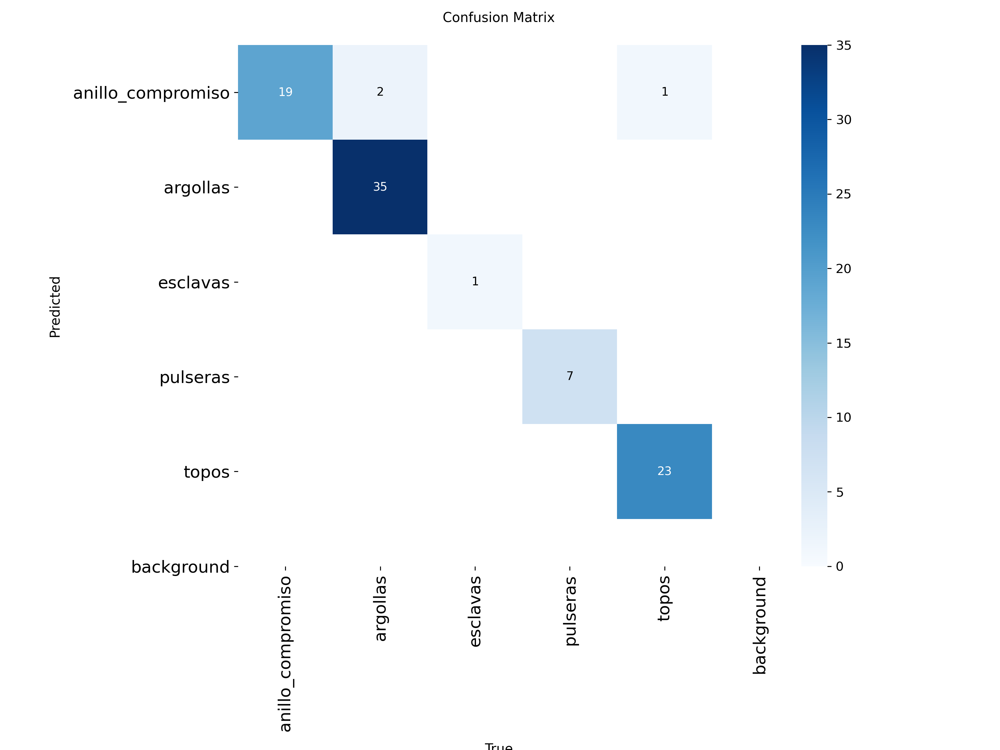

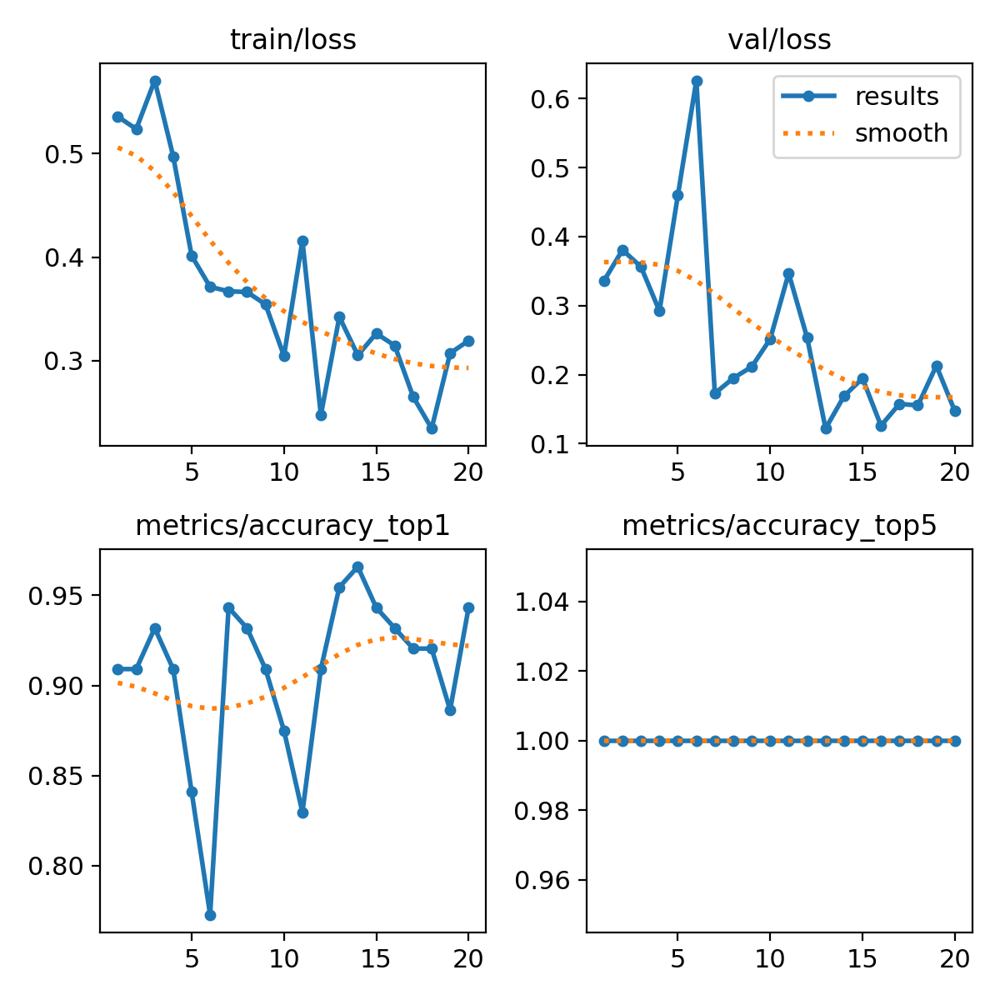

In [101]:
from IPython.display import Image, display
display(Image("/content/runs/classify/train3/confusion_matrix.png"))
display(Image("/content/runs/classify/train3/results.png"))

**Probamos el Modelo**

In [102]:
# Asegúrate de usar la ruta al modelo que entrenaste
model = YOLO('/content/runs/classify/train3/weights/best.pt')

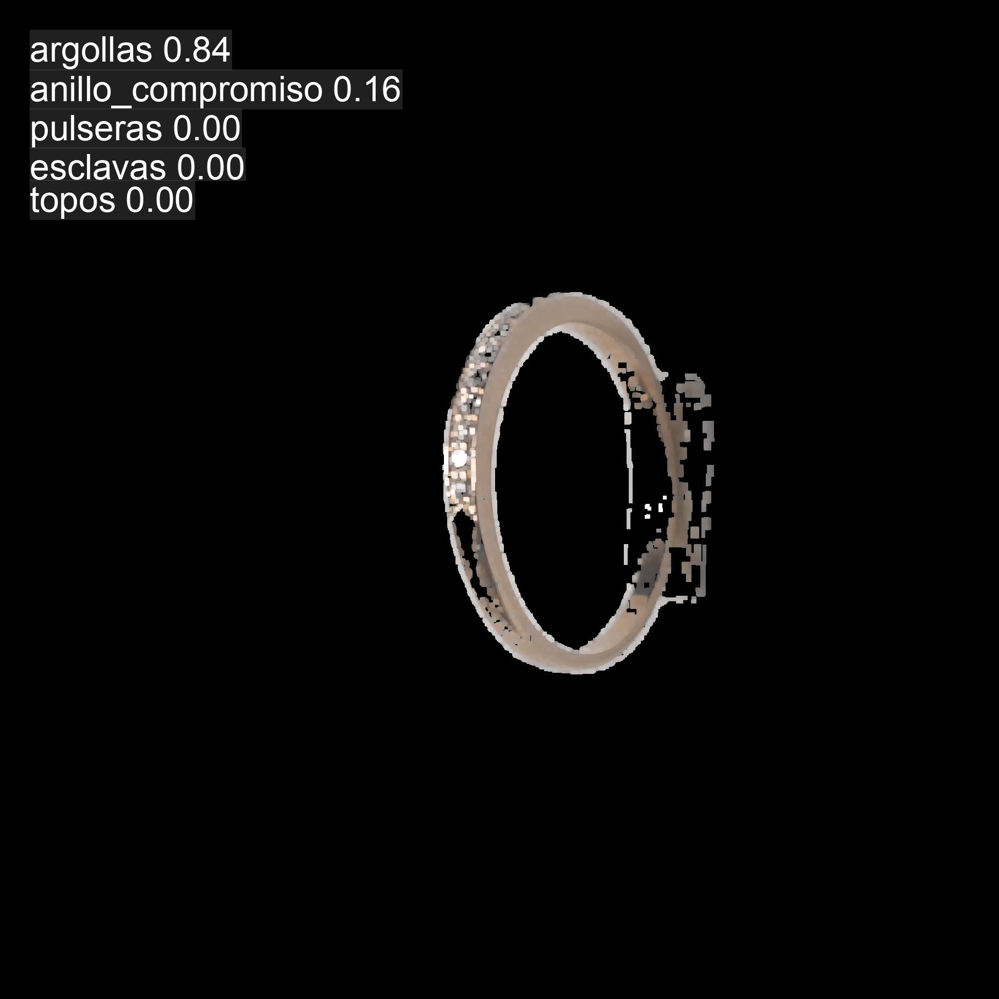

In [99]:
results2 = model.predict('/content/drive/MyDrive/Tesis Fabio/dataset/val/argollas/5310001034_20250525_095240.jpg')
results2[0].show()

Testeo del modeo

In [90]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import os

# Obtener rutas de imágenes de validación
val_dir = "/content/drive/MyDrive/Tesis Fabio/dataset/val"
clases = sorted(os.listdir(val_dir))

print(clases)



['anillo_compromiso', 'argollas', 'esclavas', 'pulseras', 'topos']


In [91]:
y_true = []
y_pred = []

for i, clase in enumerate(clases):
    print(f"Procesando clase: {clase}")
    clase_dir = os.path.join(val_dir, clase)
    for img_name in os.listdir(clase_dir):
        img_path = os.path.join(clase_dir, img_name)
        print(f"img_name: {img_name}")
        results = model.predict(img_path, verbose=False)
        pred = results[0].probs.top1  # índice de la clase predicha
        y_true.append(i)
        print(f"Procesando clase valor: {i}")
        print(f"Procesando clase valorpredicho: {pred}")
        y_pred.append(pred)

Procesando clase: anillo_compromiso
img_name: 011173T026_20250525_100512.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100303.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100357.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100646.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100806.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100606.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100438.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100517.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100610.jpg
Procesando clase valor: 0
Procesando clase valorpredicho: 0
img_name: 011173T026_20250525_100456.jpg
Procesando cla

**Metricas Modelo**

In [100]:
print("✅ Métricas de clasificación:\n")
print(classification_report(y_true, y_pred, target_names=clases))

# También puedes mostrar la matriz de confusión en texto
print("📌 Matriz de confusión:")
print(confusion_matrix(y_true, y_pred))

✅ Métricas de clasificación:

                   precision    recall  f1-score   support

anillo_compromiso       0.86      1.00      0.93        19
         argollas       1.00      0.95      0.97        37
         esclavas       1.00      1.00      1.00         1
         pulseras       1.00      1.00      1.00         7
            topos       1.00      0.96      0.98        24

         accuracy                           0.97        88
        macro avg       0.97      0.98      0.98        88
     weighted avg       0.97      0.97      0.97        88

📌 Matriz de confusión:
[[19  0  0  0  0]
 [ 2 35  0  0  0]
 [ 0  0  1  0  0]
 [ 0  0  0  7  0]
 [ 1  0  0  0 23]]


**Descargar modelo**

In [92]:
import shutil

shutil.make_archive('/content/runs/classify/train3', 'zip', '/content/runs/classify/')

'/content/runs/classify/train3.zip'


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_094424.jpg: 448x448 topos 0.96, argollas 0.04, anillo_compromiso 0.00, pulseras 0.00, esclavas 0.00, 194.1ms
Speed: 103.2ms preprocess, 194.1ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


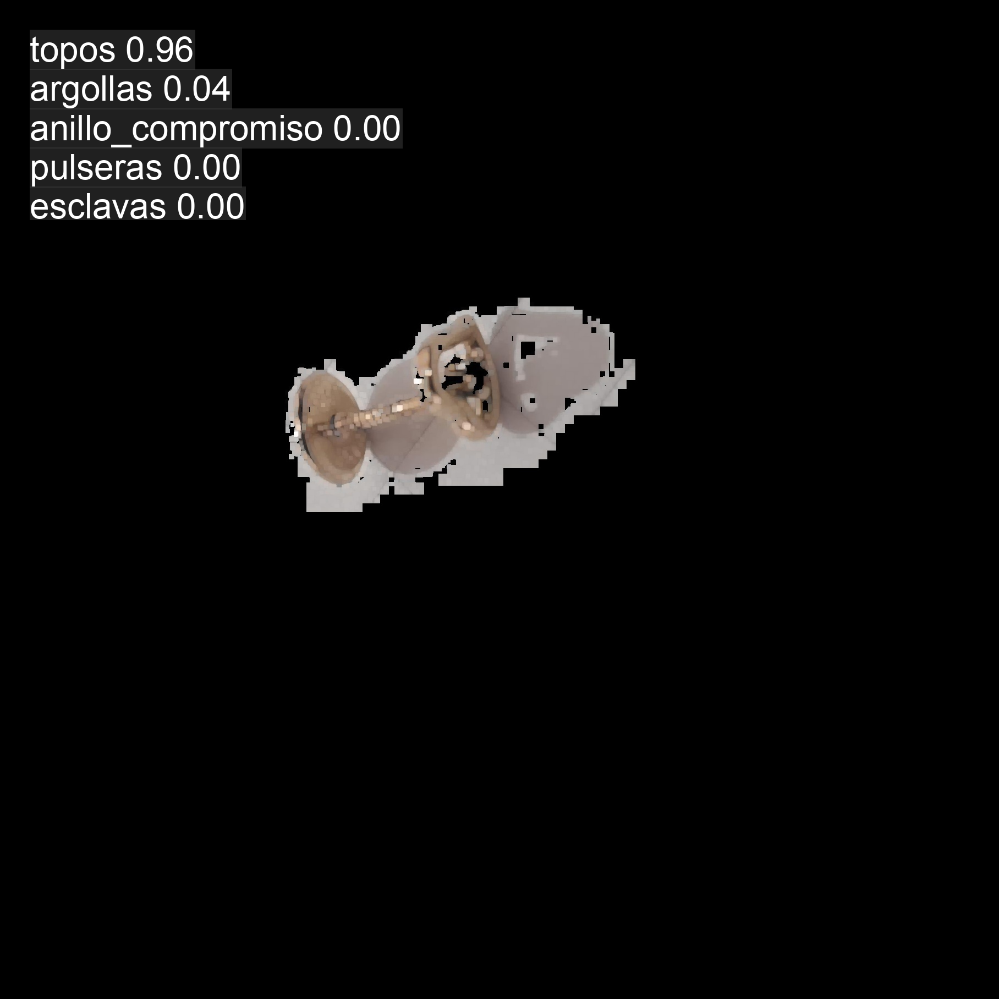


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250525_101542.jpg: 448x448 topos 0.48, anillo_compromiso 0.35, argollas 0.07, pulseras 0.05, esclavas 0.05, 140.3ms
Speed: 100.9ms preprocess, 140.3ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


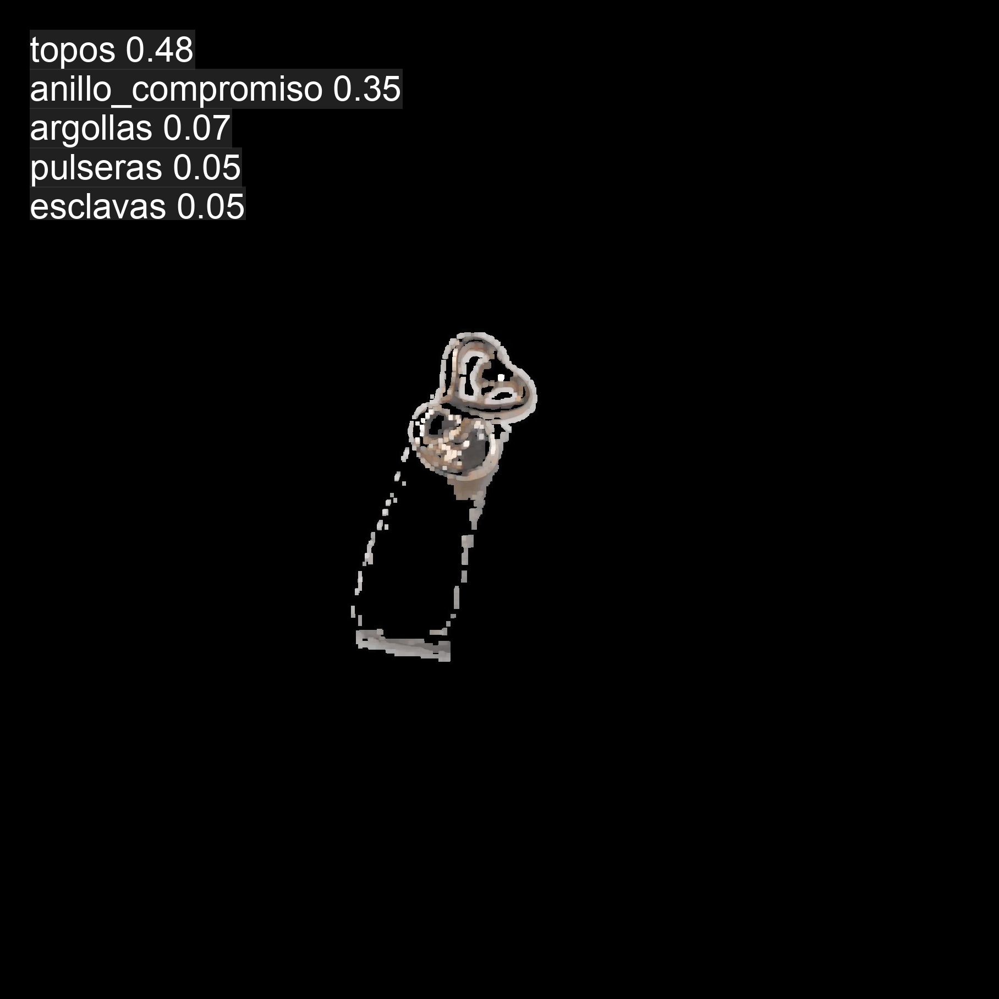


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102720 (1).jpg: 448x448 topos 0.89, argollas 0.05, anillo_compromiso 0.03, pulseras 0.02, esclavas 0.00, 76.0ms
Speed: 64.7ms preprocess, 76.0ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


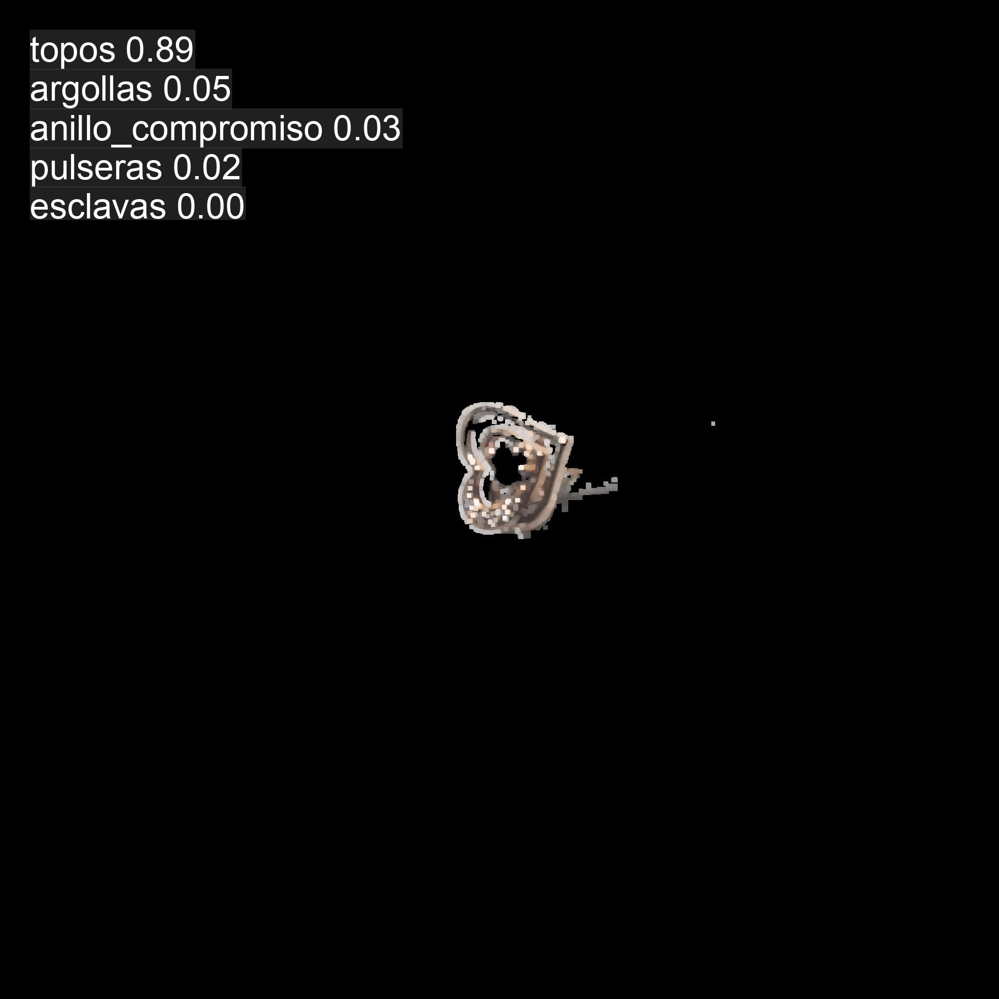


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_094543.jpg: 448x448 topos 0.55, anillo_compromiso 0.34, esclavas 0.06, argollas 0.05, pulseras 0.01, 81.0ms
Speed: 63.7ms preprocess, 81.0ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


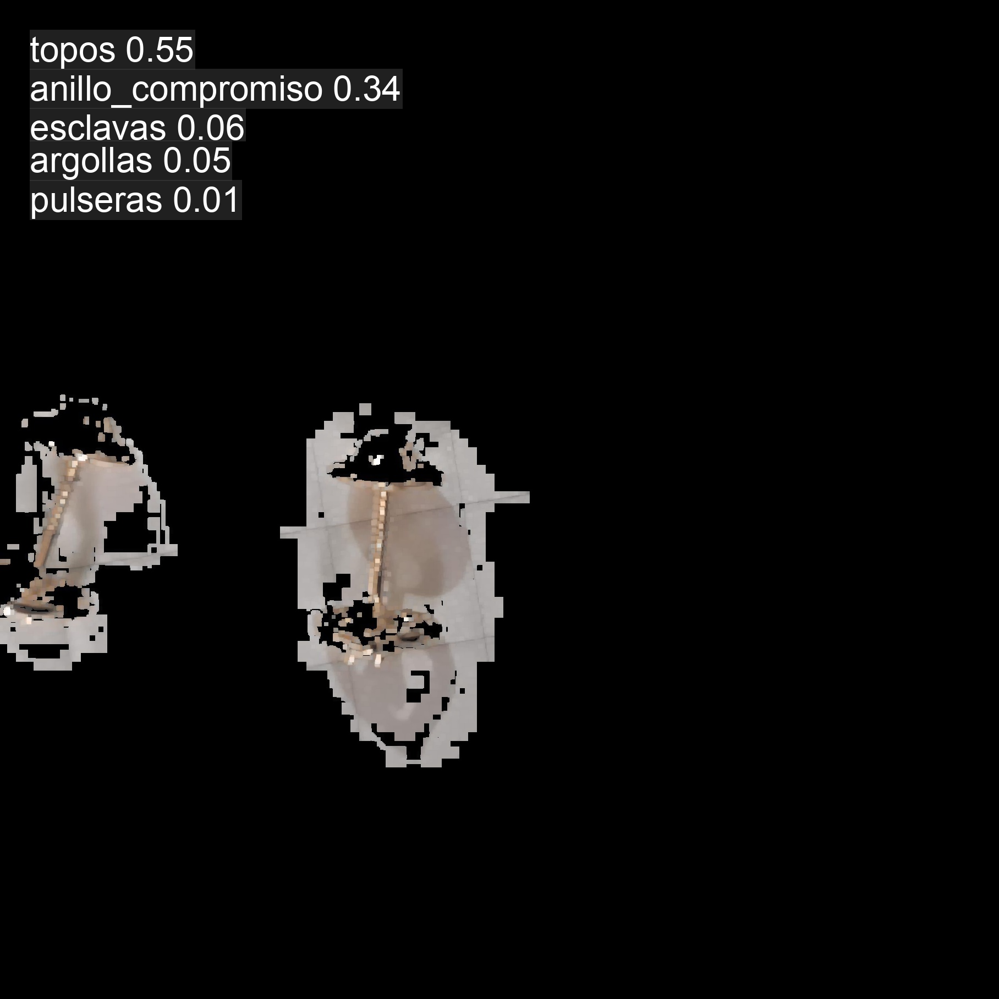


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102607.jpg: 448x448 topos 0.99, argollas 0.01, anillo_compromiso 0.00, pulseras 0.00, esclavas 0.00, 123.3ms
Speed: 87.5ms preprocess, 123.3ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


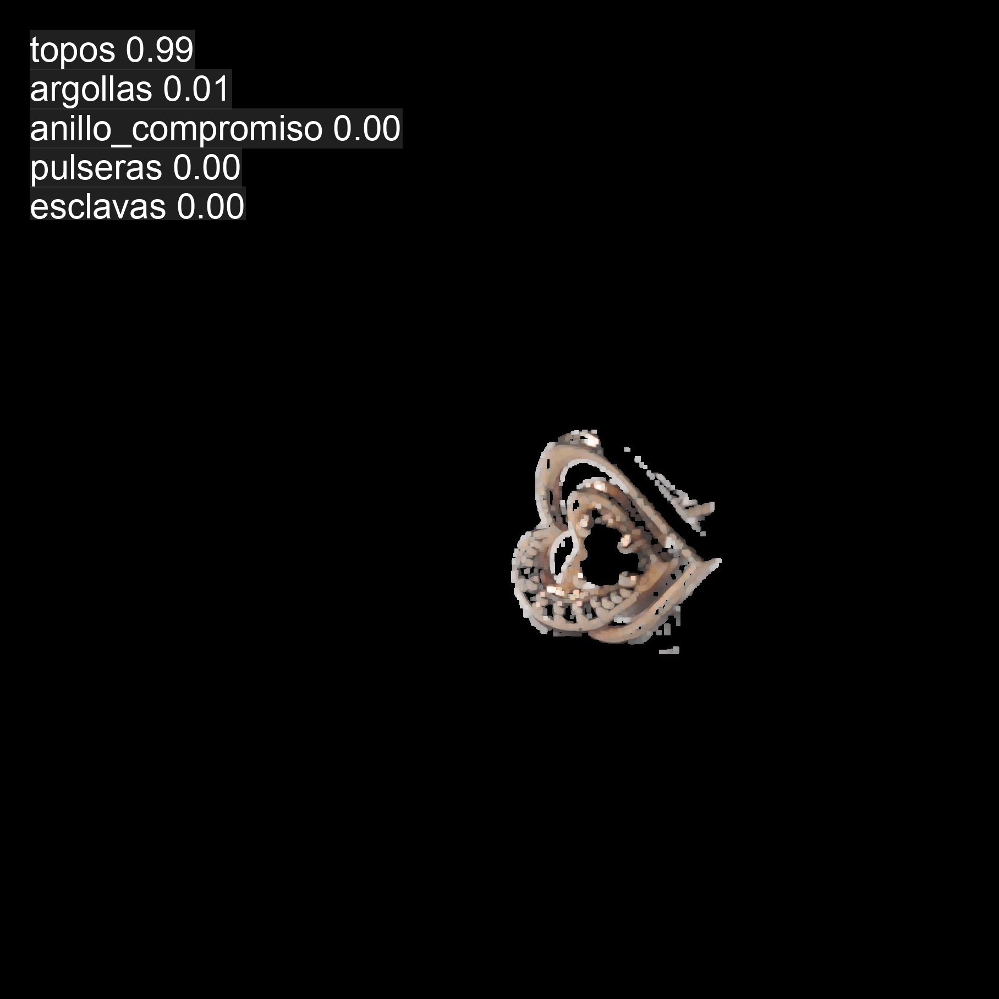


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_094601.jpg: 448x448 topos 1.00, argollas 0.00, esclavas 0.00, anillo_compromiso 0.00, pulseras 0.00, 80.0ms
Speed: 79.5ms preprocess, 80.0ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


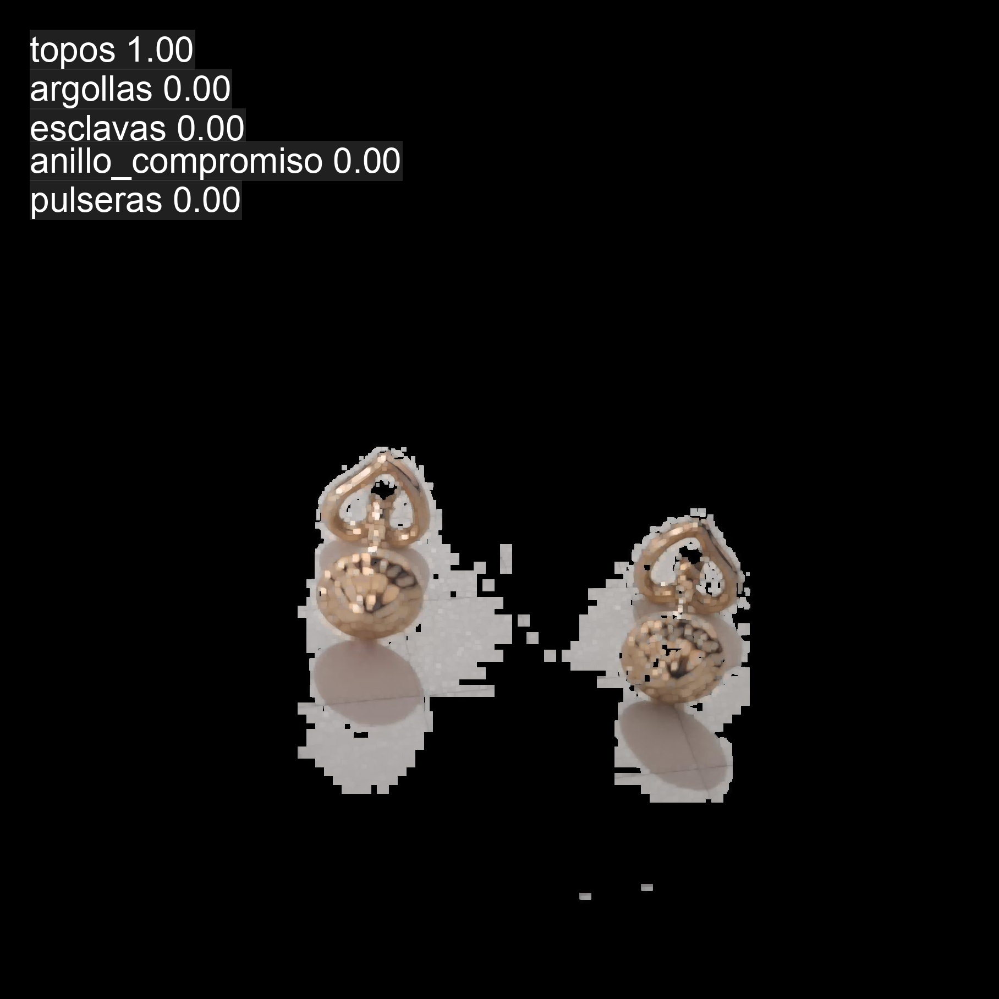


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102940 (1).jpg: 448x448 topos 0.98, argollas 0.02, anillo_compromiso 0.00, pulseras 0.00, esclavas 0.00, 78.6ms
Speed: 55.9ms preprocess, 78.6ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


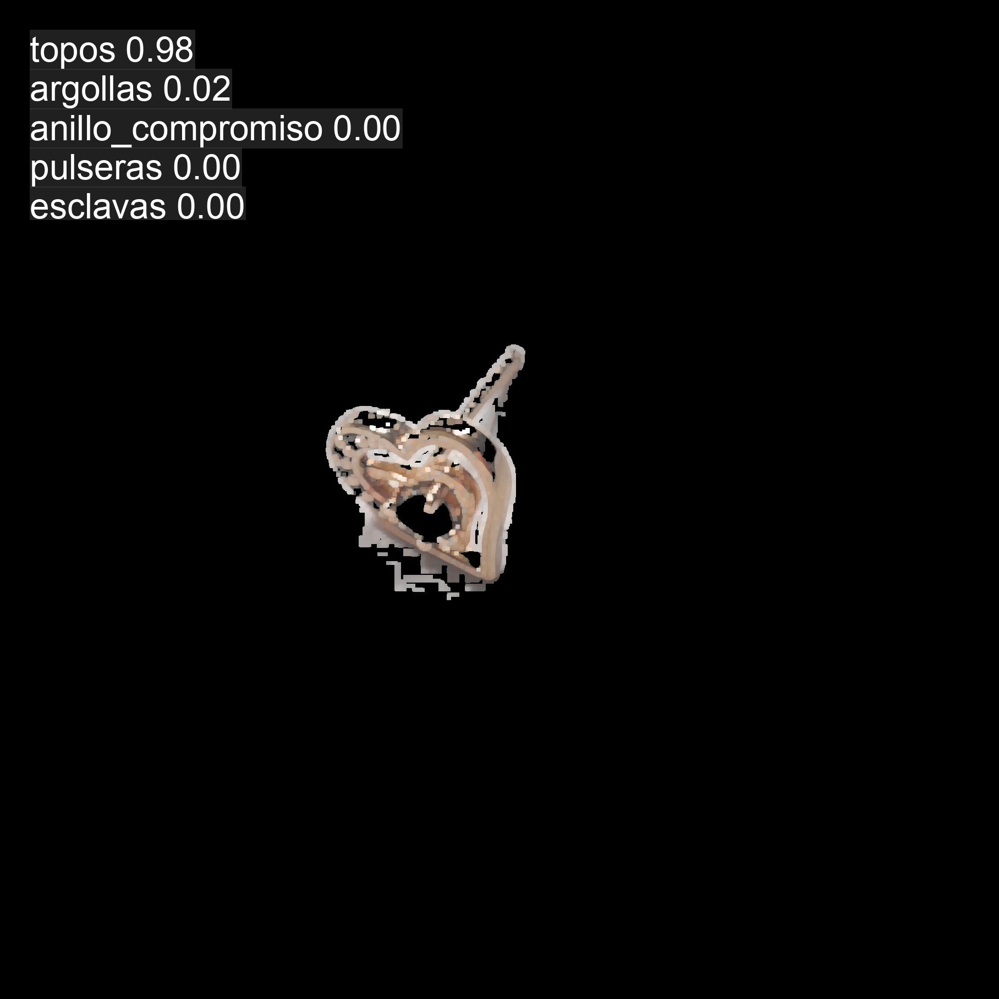


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_124907.jpg: 448x448 topos 0.95, argollas 0.05, esclavas 0.00, anillo_compromiso 0.00, pulseras 0.00, 75.5ms
Speed: 50.1ms preprocess, 75.5ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


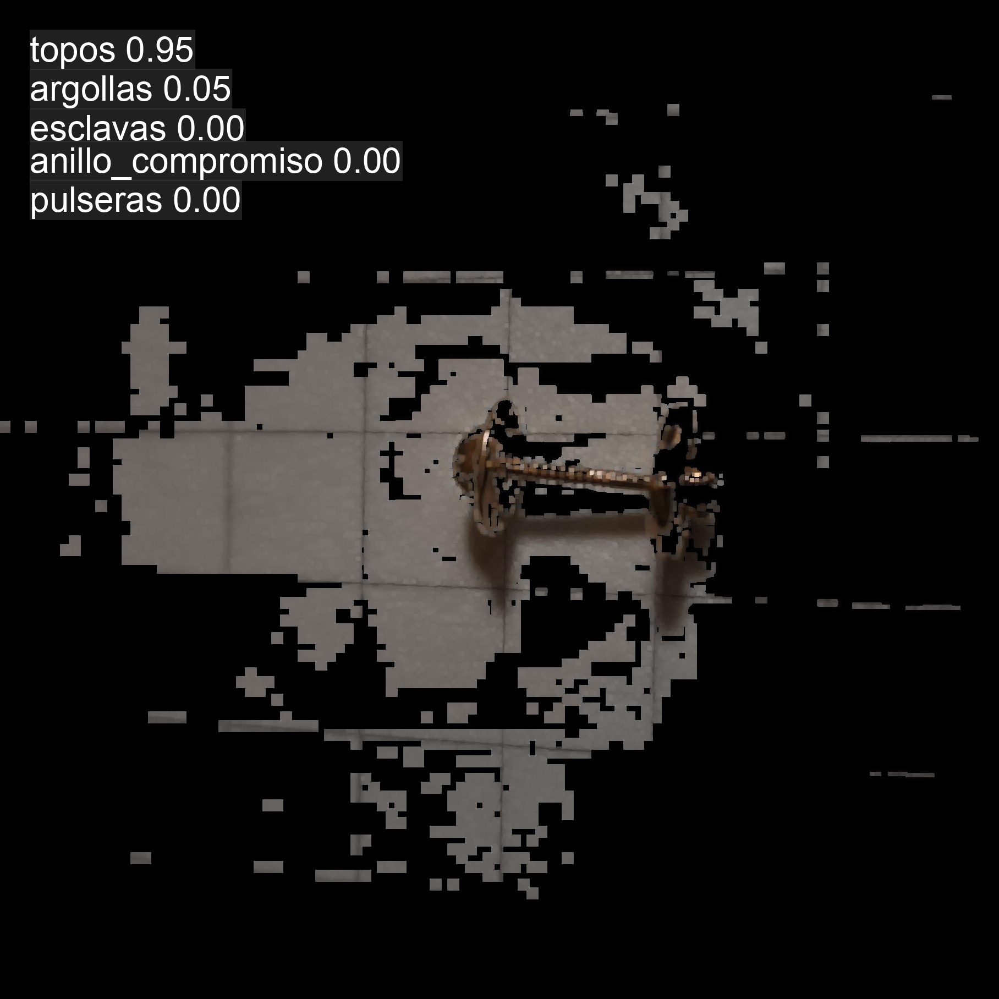


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_124712.jpg: 448x448 topos 0.99, argollas 0.01, esclavas 0.00, anillo_compromiso 0.00, pulseras 0.00, 78.4ms
Speed: 65.7ms preprocess, 78.4ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


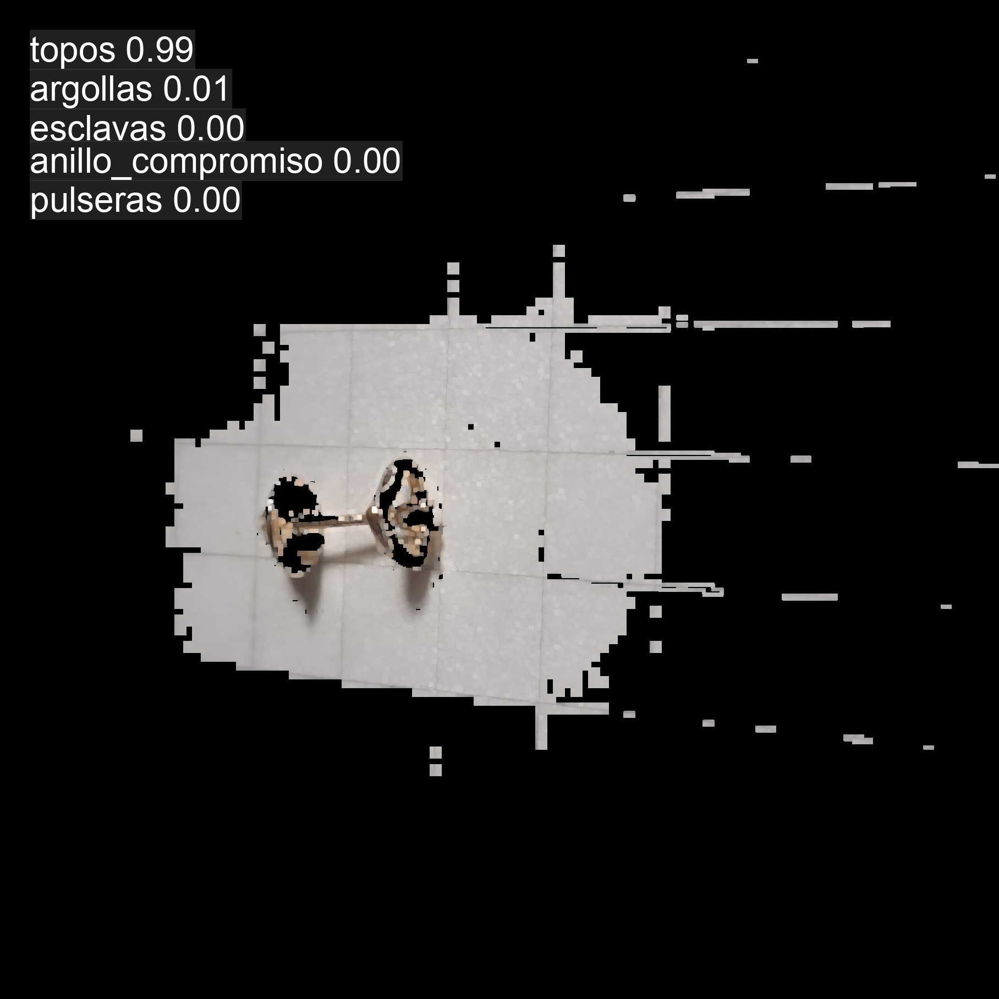


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250525_101520.jpg: 448x448 topos 0.94, argollas 0.04, anillo_compromiso 0.01, pulseras 0.01, esclavas 0.01, 74.7ms
Speed: 51.0ms preprocess, 74.7ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


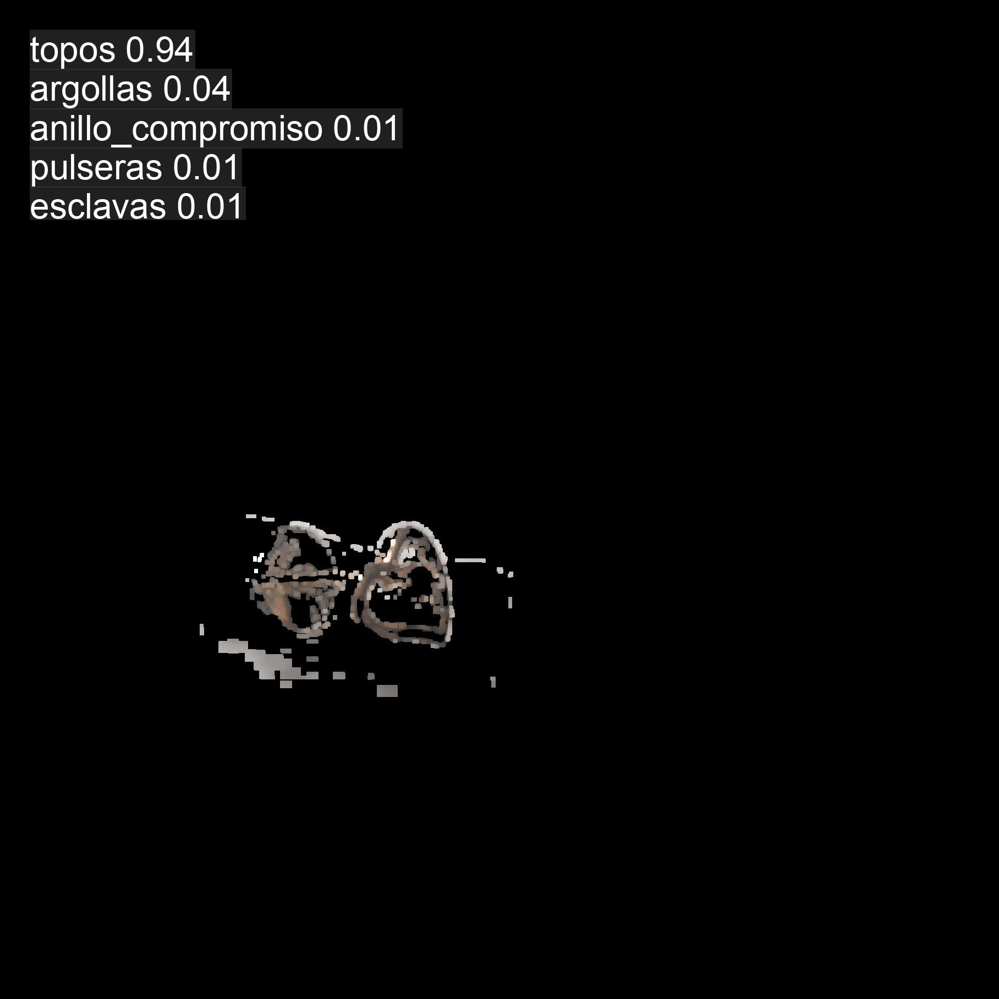


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_094437.jpg: 448x448 topos 0.96, argollas 0.02, esclavas 0.01, anillo_compromiso 0.01, pulseras 0.00, 85.9ms
Speed: 55.6ms preprocess, 85.9ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


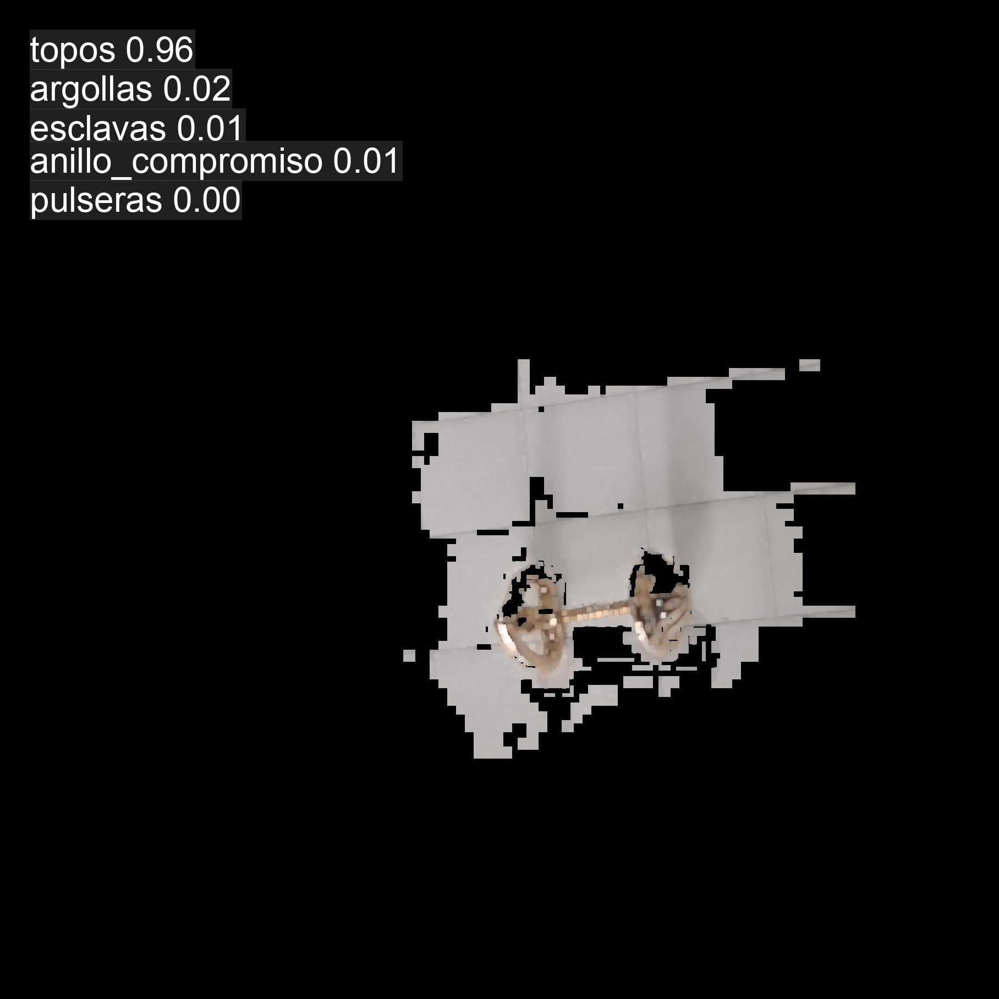


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250525_101904.jpg: 448x448 anillo_compromiso 0.59, pulseras 0.19, topos 0.13, esclavas 0.05, argollas 0.04, 73.5ms
Speed: 52.9ms preprocess, 73.5ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


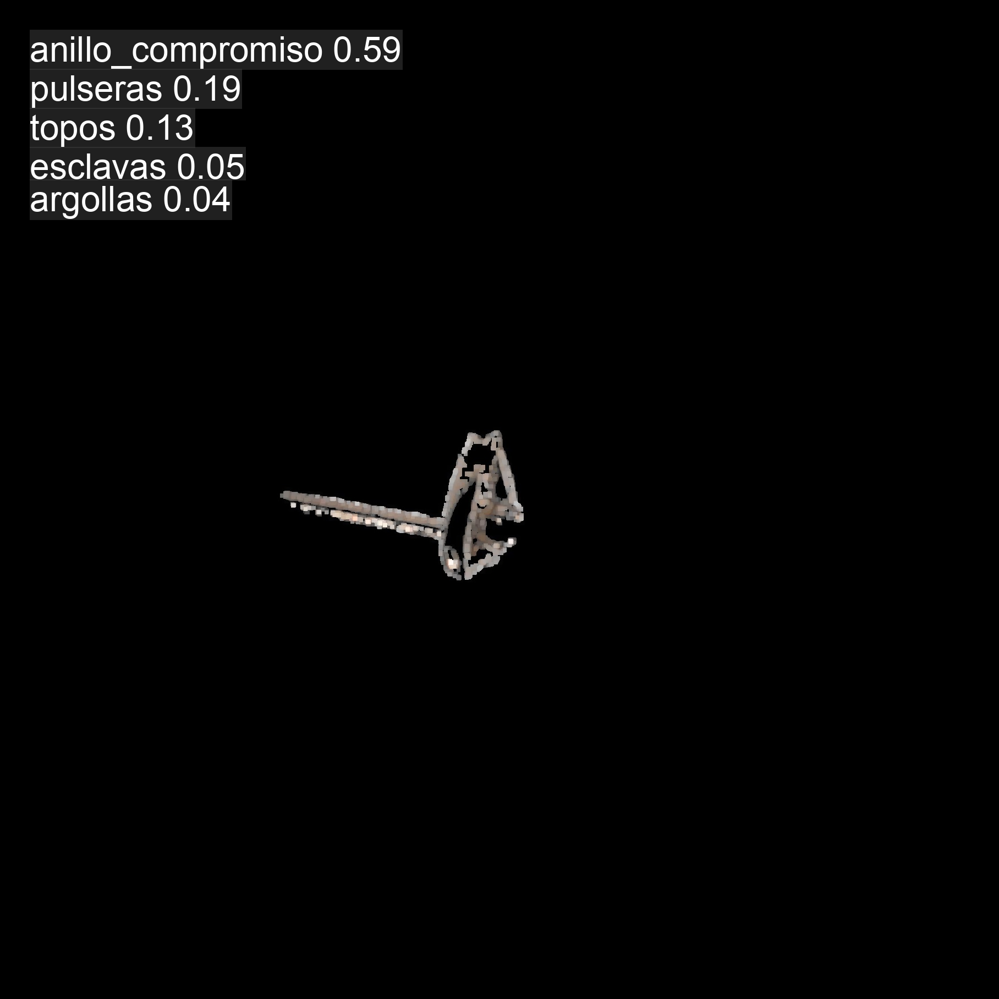


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_124813.jpg: 448x448 topos 0.98, argollas 0.02, esclavas 0.00, anillo_compromiso 0.00, pulseras 0.00, 95.1ms
Speed: 53.2ms preprocess, 95.1ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


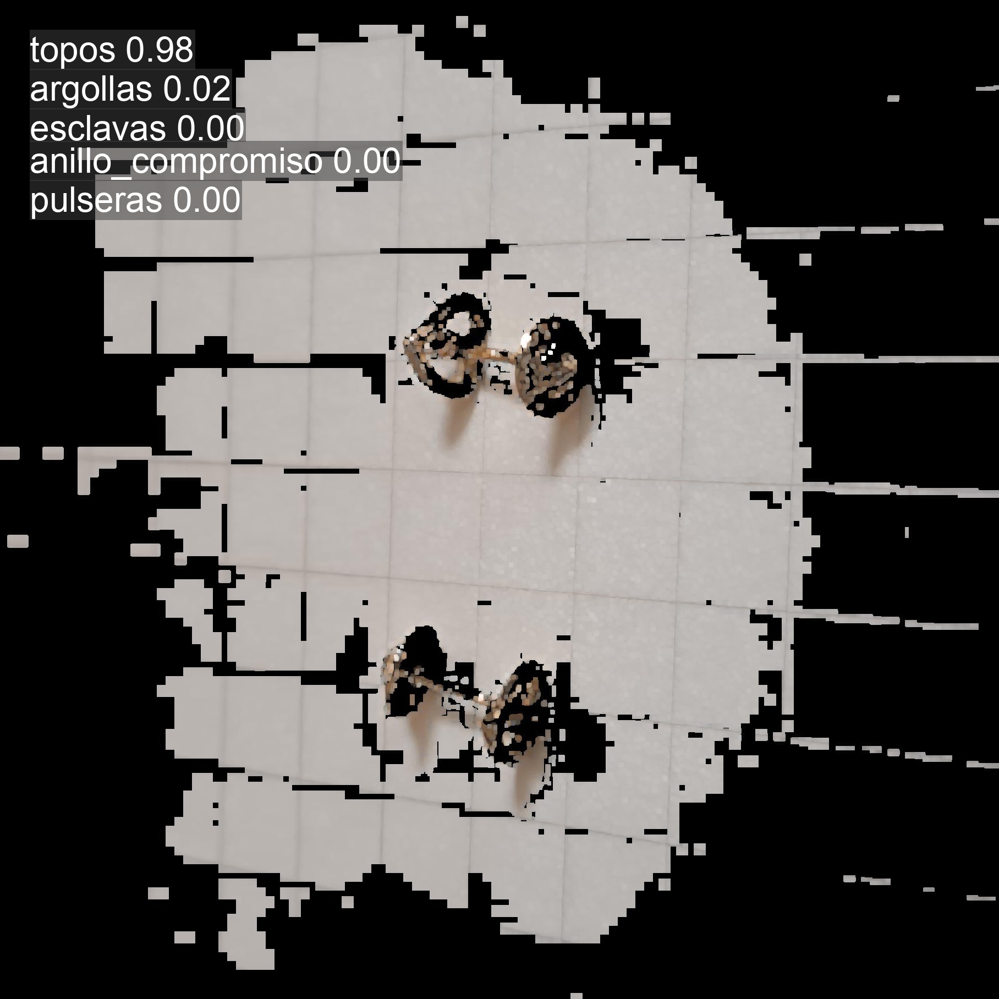


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250525_101529.jpg: 448x448 topos 0.87, argollas 0.04, pulseras 0.04, anillo_compromiso 0.03, esclavas 0.02, 72.2ms
Speed: 50.8ms preprocess, 72.2ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


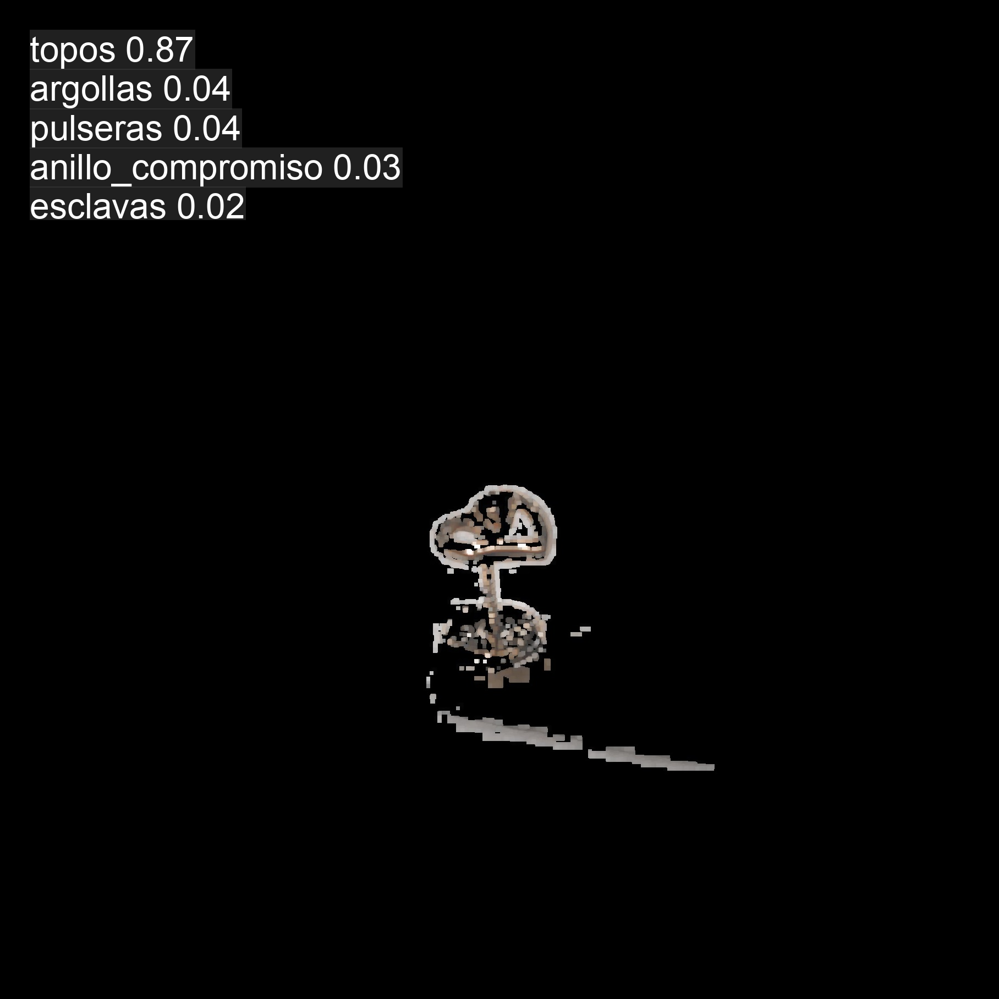


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250525_101626.jpg: 448x448 topos 0.89, anillo_compromiso 0.04, argollas 0.04, esclavas 0.02, pulseras 0.01, 77.0ms
Speed: 63.9ms preprocess, 77.0ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


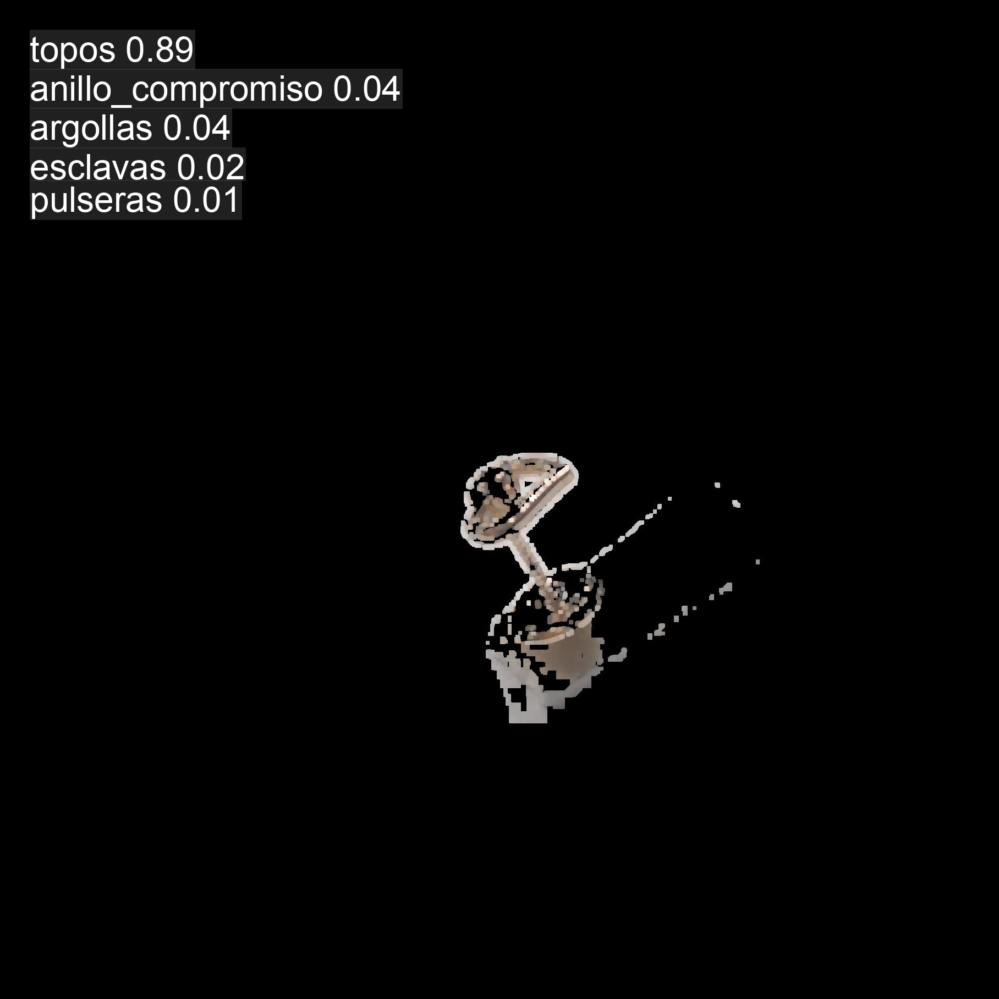


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102541 (1).jpg: 448x448 topos 0.98, argollas 0.02, anillo_compromiso 0.00, pulseras 0.00, esclavas 0.00, 76.5ms
Speed: 53.0ms preprocess, 76.5ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


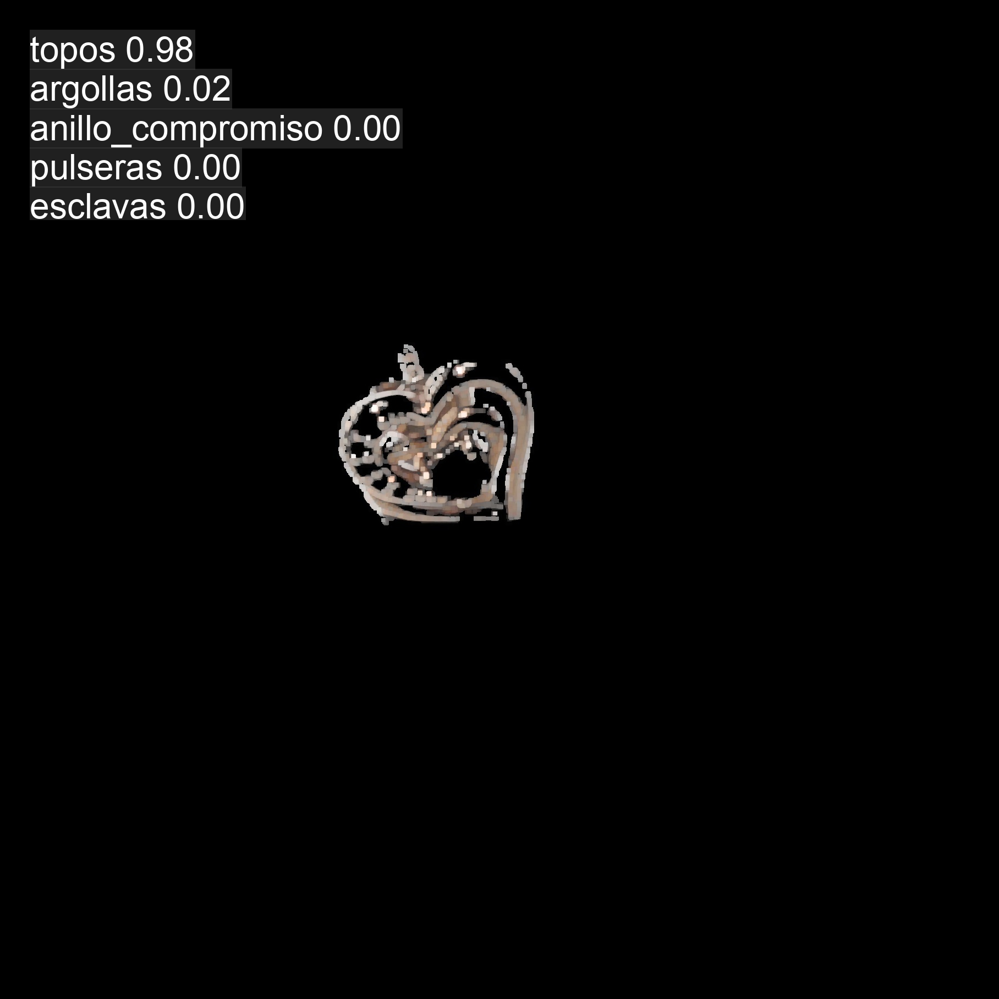


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102609.jpg: 448x448 topos 0.99, argollas 0.01, anillo_compromiso 0.00, esclavas 0.00, pulseras 0.00, 96.0ms
Speed: 57.0ms preprocess, 96.0ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


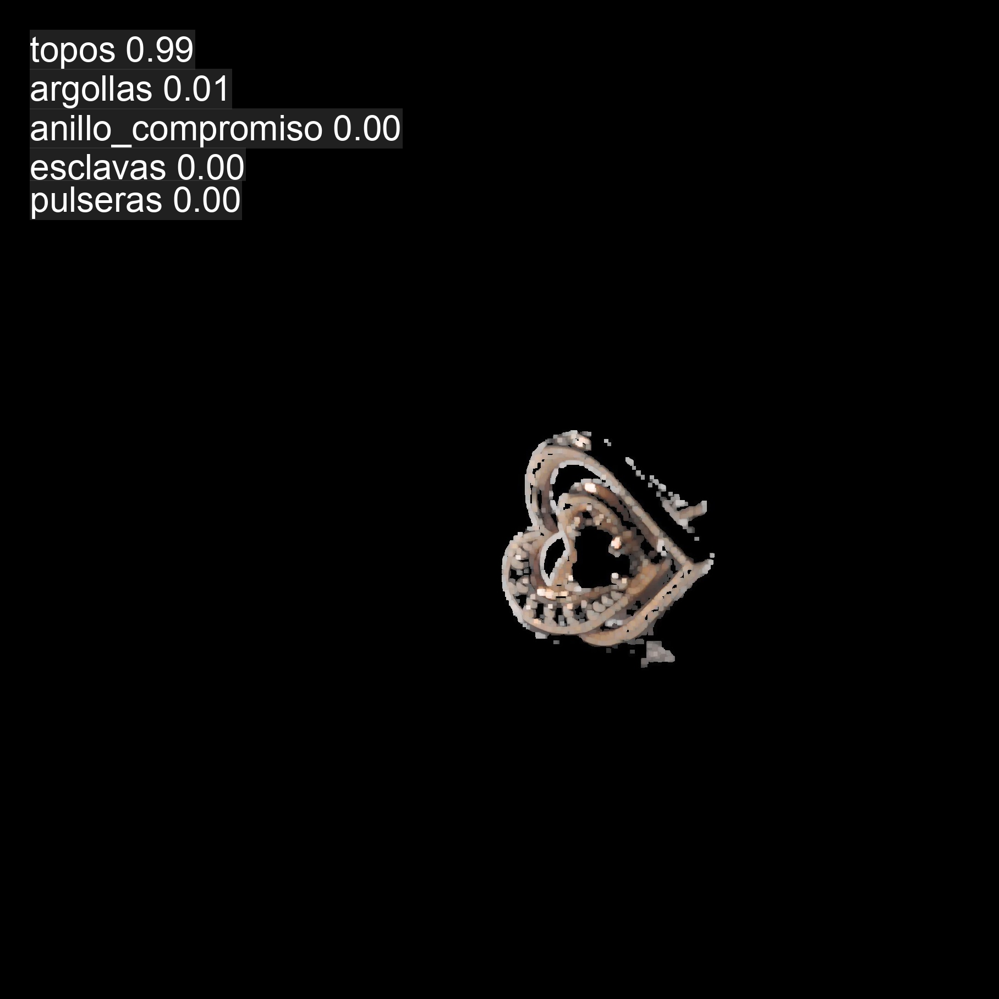


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250525_101637.jpg: 448x448 topos 0.77, esclavas 0.10, anillo_compromiso 0.08, argollas 0.04, pulseras 0.02, 77.5ms
Speed: 56.6ms preprocess, 77.5ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


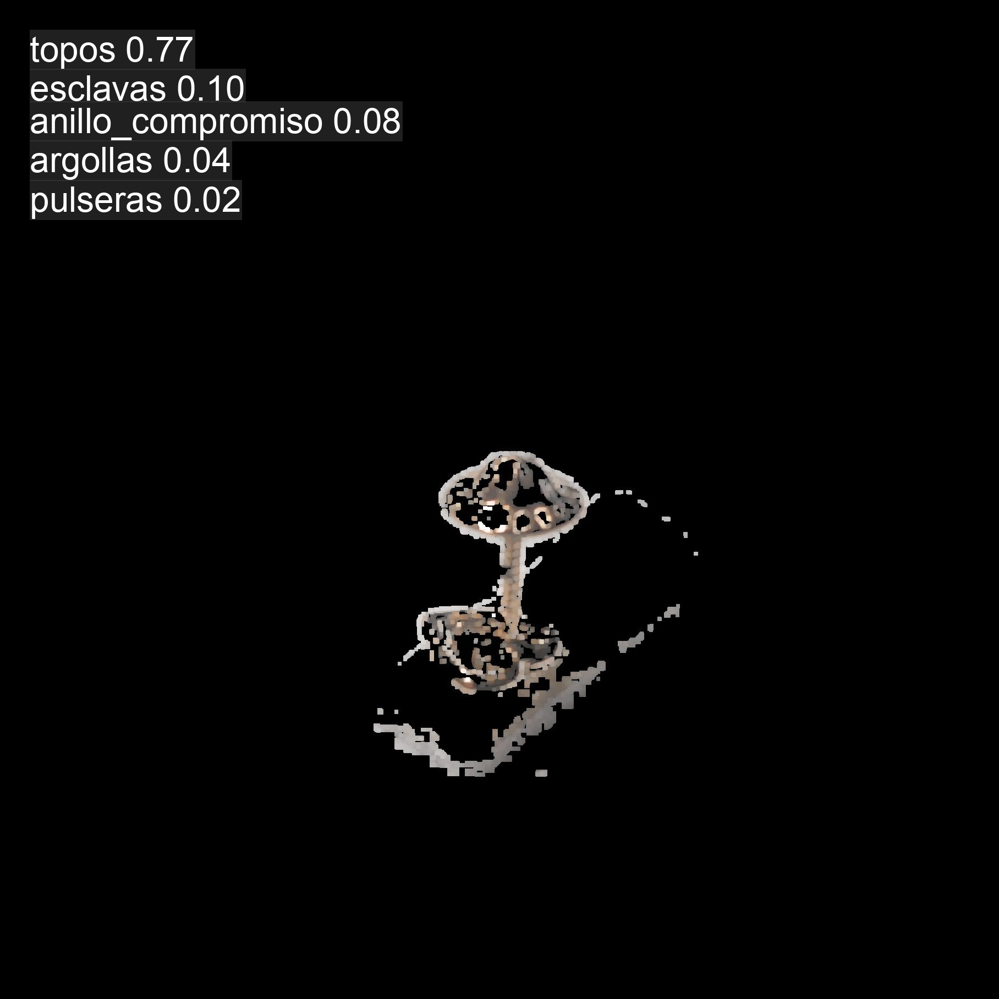


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102619.jpg: 448x448 topos 0.96, argollas 0.02, anillo_compromiso 0.01, pulseras 0.01, esclavas 0.00, 109.0ms
Speed: 56.1ms preprocess, 109.0ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


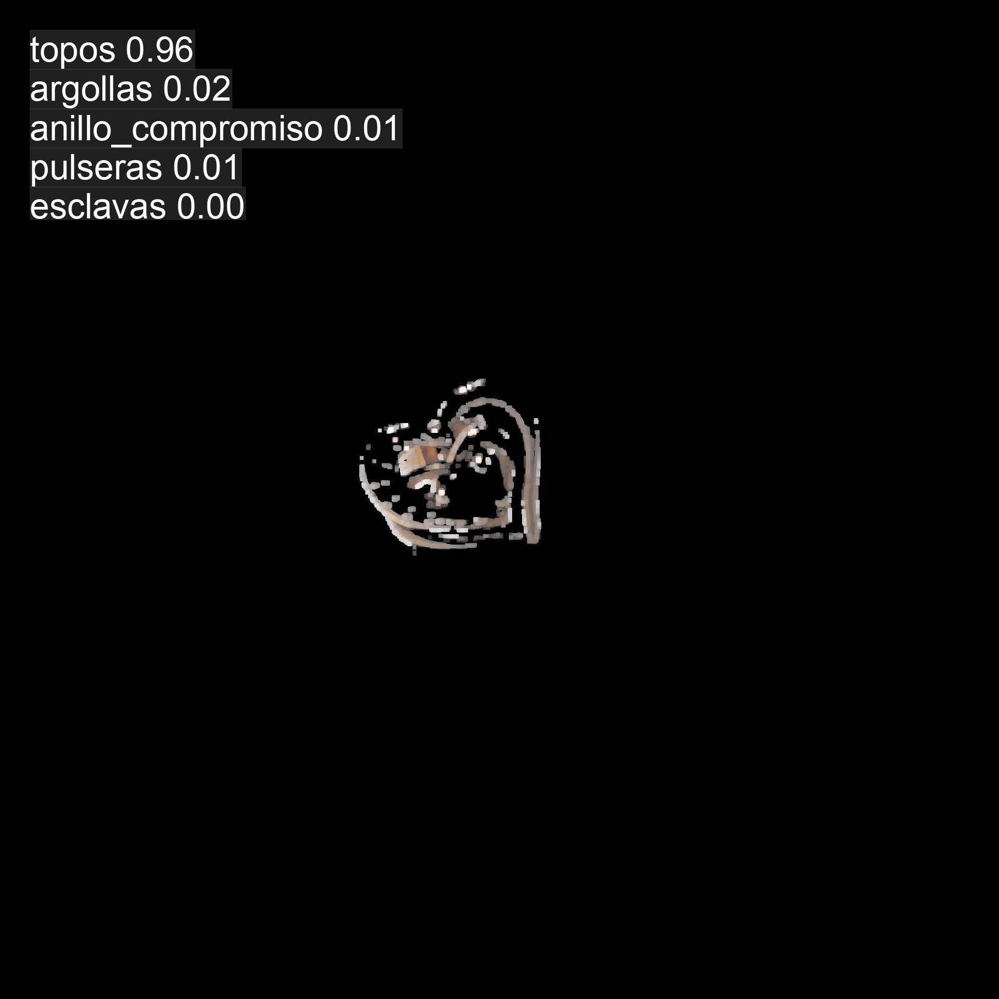


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_124744.jpg: 448x448 topos 0.87, argollas 0.13, esclavas 0.00, anillo_compromiso 0.00, pulseras 0.00, 74.5ms
Speed: 54.0ms preprocess, 74.5ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


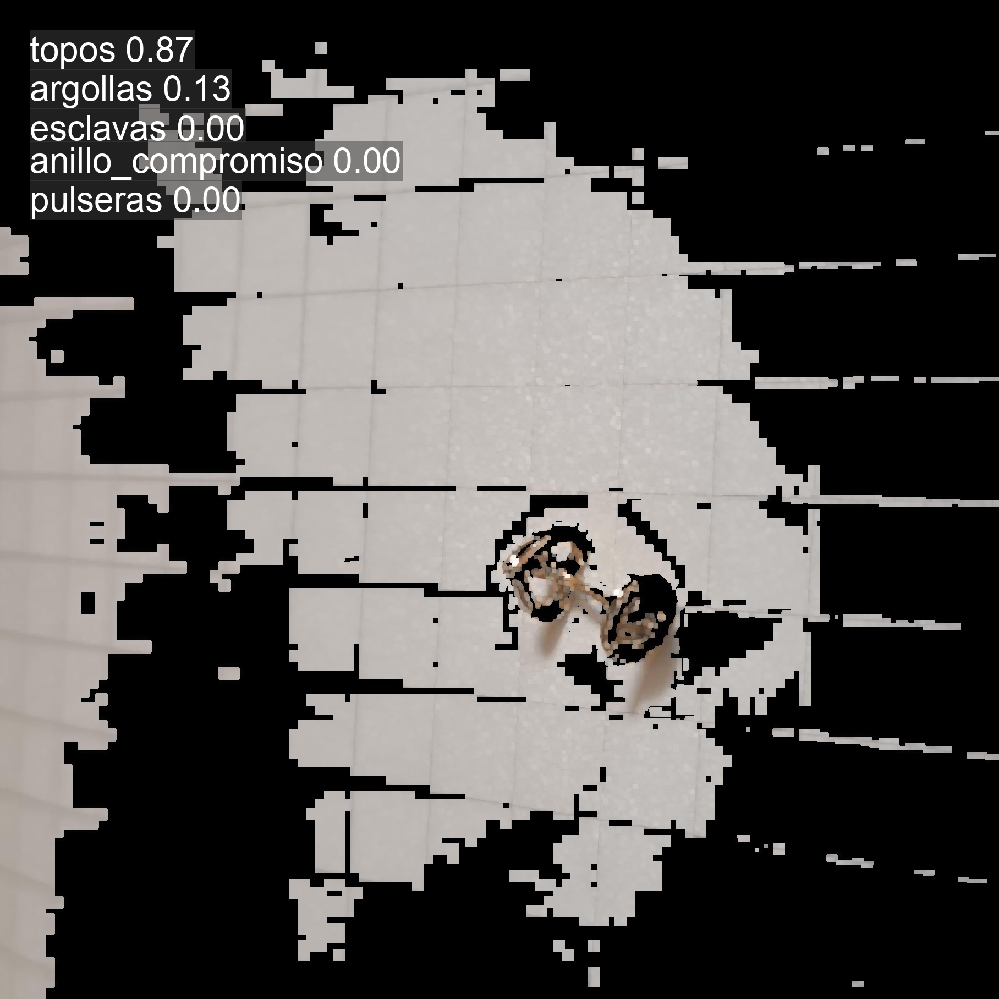


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102640.jpg: 448x448 topos 0.99, argollas 0.01, anillo_compromiso 0.00, esclavas 0.00, pulseras 0.00, 89.3ms
Speed: 51.2ms preprocess, 89.3ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


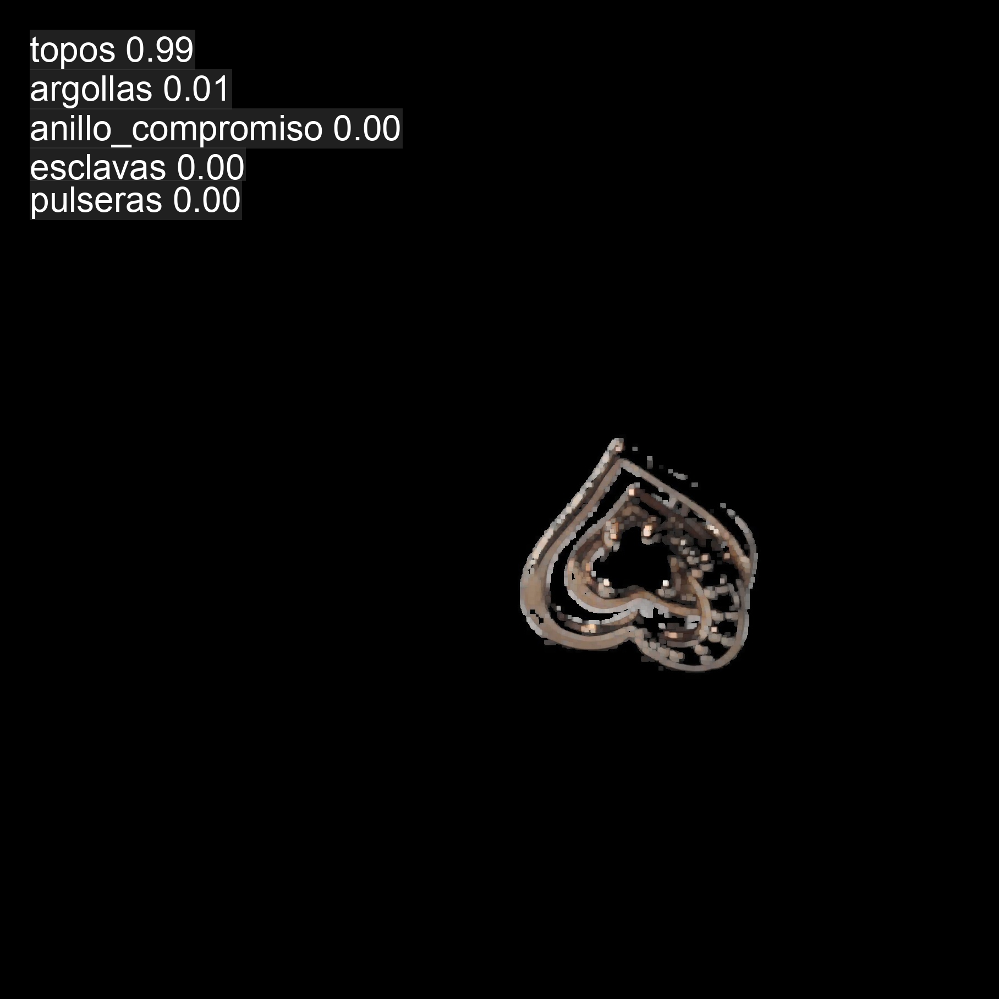


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250524_124913.jpg: 448x448 topos 0.98, argollas 0.02, esclavas 0.00, anillo_compromiso 0.00, pulseras 0.00, 74.8ms
Speed: 54.6ms preprocess, 74.8ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


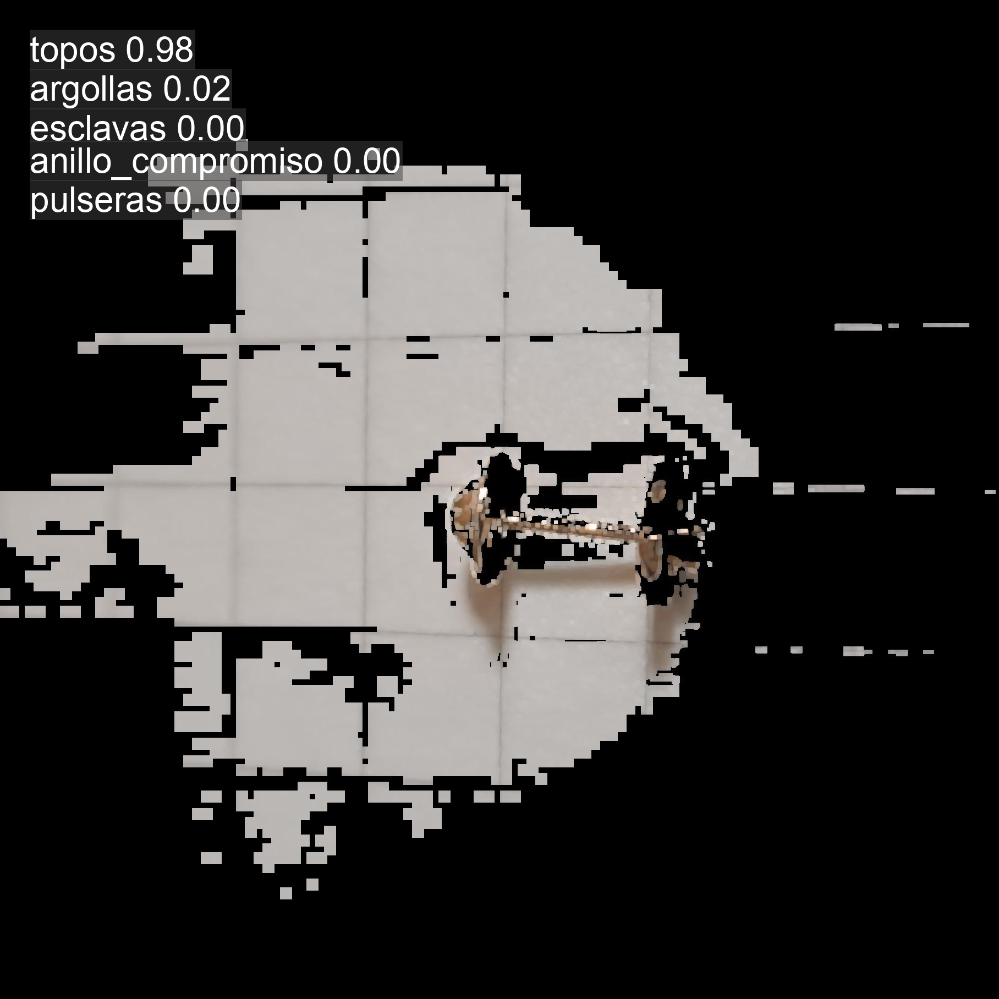


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/1510021022_20250525_102609 (1).jpg: 448x448 topos 0.99, argollas 0.01, anillo_compromiso 0.00, esclavas 0.00, pulseras 0.00, 78.9ms
Speed: 52.7ms preprocess, 78.9ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


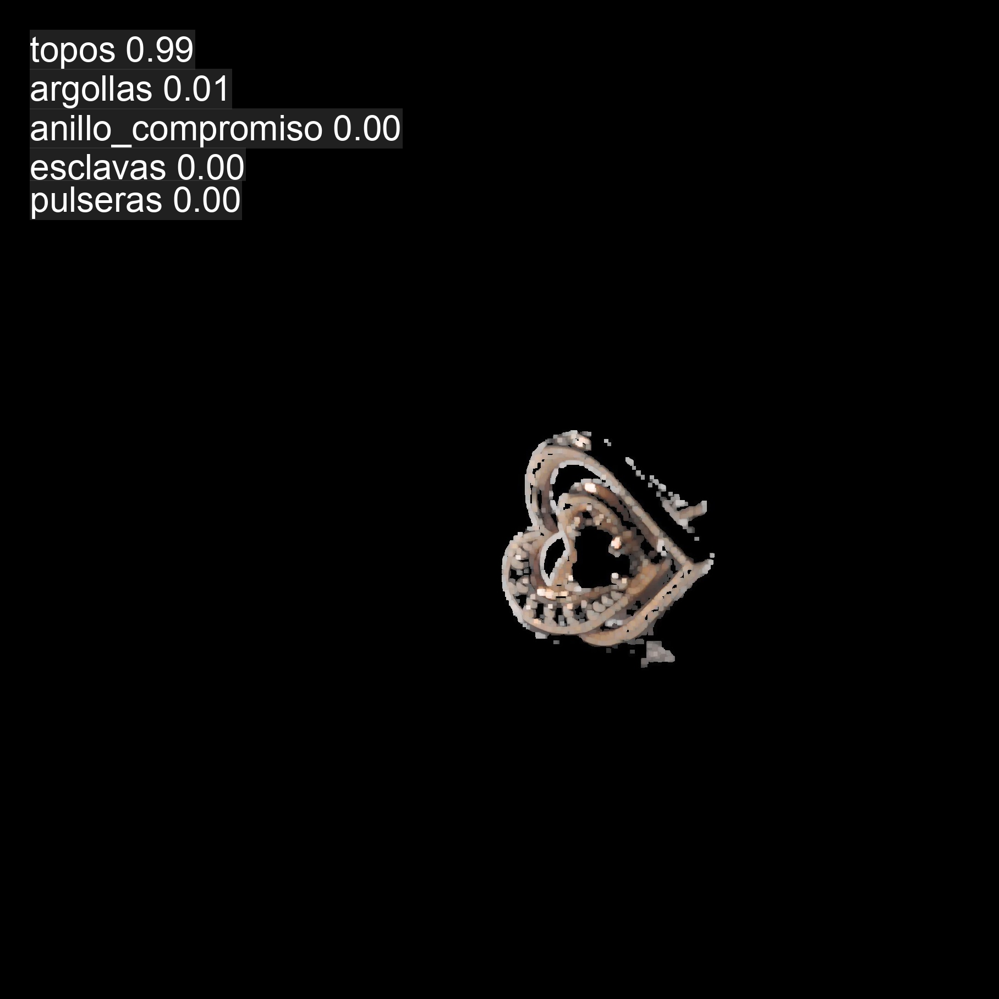


image 1/1 /content/drive/MyDrive/Tesis Fabio/dataset/val/topos/3512700009_20250525_101720.jpg: 448x448 topos 0.76, argollas 0.09, esclavas 0.06, anillo_compromiso 0.06, pulseras 0.03, 79.4ms
Speed: 52.8ms preprocess, 79.4ms inference, 0.1ms postprocess per image at shape (1, 3, 448, 448)


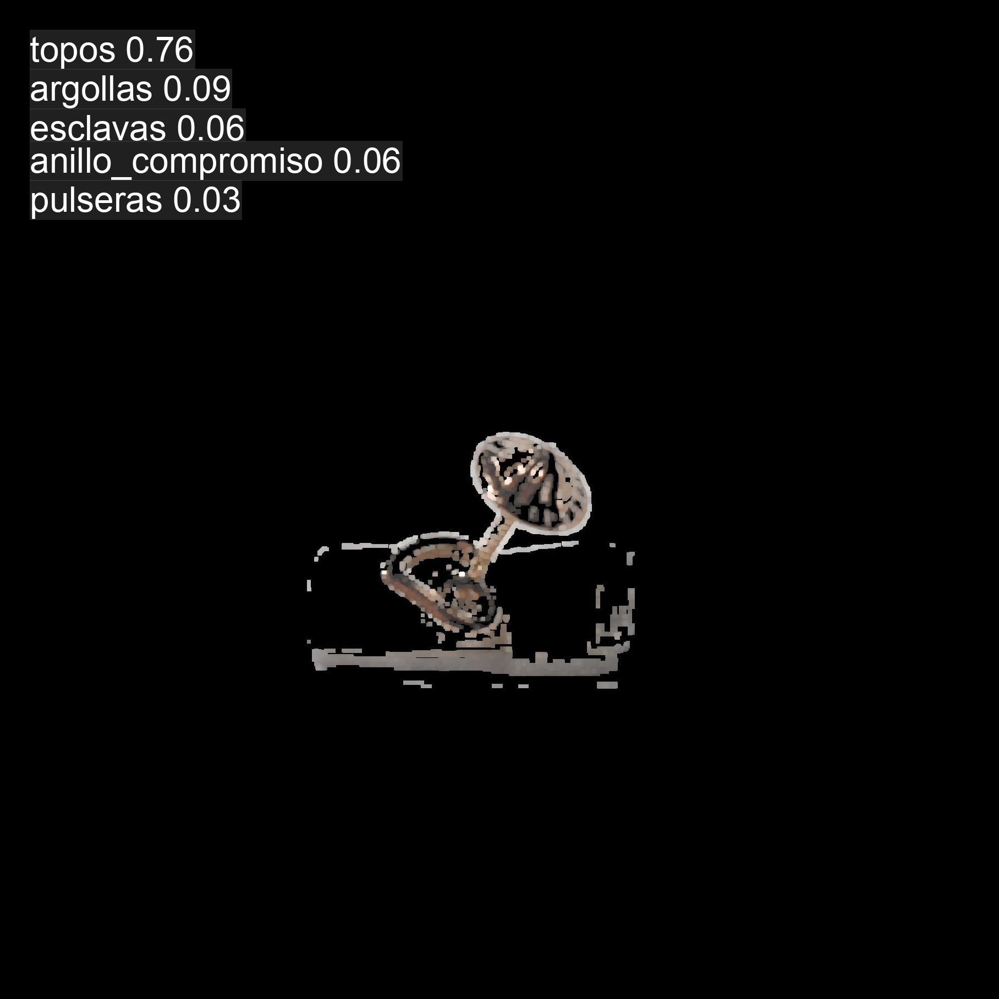

In [104]:
val_dir = "/content/drive/MyDrive/Tesis Fabio/dataset/val/topos"
clases = sorted(os.listdir(val_dir))
for  nombre_img in os.listdir(val_dir):
  ruta_imagen = os.path.join(val_dir, nombre_img)
  results3 = model.predict(ruta_imagen)
  results3[0].show()